In [8]:
import pandas as pd
import lightgbm as lgb
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
import pyarrow.parquet as pq
from sklearn.model_selection import GridSearchCV

import warnings

warnings.filterwarnings('ignore')

plt.style.use('fivethirtyeight')

In [9]:
# Загружаем файл с первым вариантом обработки данных, агрегация по mean.
file_path = 'dataset_full_ohe.parquet'

table = pq.read_table(file_path)
df = table.to_pandas()

print(f"Обработка файла завершена.")

Обработка файла завершена.


In [10]:
# Проверяем датафрейм
df.head(20)

,pre_since_opened_0,pre_since_opened_1,pre_since_opened_2,pre_since_opened_3,pre_since_opened_4,pre_since_opened_5,pre_since_opened_6,pre_since_opened_7,pre_since_opened_8,pre_since_opened_9,...,is_zero_loans3060,is_zero_loans6090,is_zero_loans90,is_zero_util,is_zero_over2limit,is_zero_maxover2limit,pclose_flag,fclose_flag,no_delinquencies,flag
0,0,1,1,1,1,2,0,1,0,0,...,10,10,10,6,9,9,1,2,9,0
1,0,0,1,0,0,0,0,1,2,0,...,12,12,11,10,12,11,1,2,6,0
2,1,0,0,0,0,0,0,0,0,0,...,2,2,3,1,3,2,2,2,2,0
3,0,3,1,0,2,1,3,0,0,0,...,15,15,15,8,14,14,5,6,15,0
4,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
5,1,0,0,0,0,0,0,1,0,1,...,4,4,4,3,3,1,0,1,1,0
6,3,0,0,1,1,0,1,1,2,0,...,18,18,18,16,18,18,0,1,14,0
7,0,0,1,0,0,0,0,0,0,0,...,2,2,2,0,1,1,2,2,2,0
8,0,0,1,0,0,0,0,0,0,0,...,3,3,3,0,3,3,0,1,3,0
9,0,0,0,0,0,0,1,0,0,0,...,0,0,1,1,1,1,0,0,0,0


In [11]:
# Разделяем выборку
X = df.drop('flag', axis=1)
y = df['flag']

# Разделение данных на тренировочный и тестовый наборы
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2400000, 397)
(600000, 397)
(2400000,)
(600000,)


In [13]:
rus = RandomUnderSampler()

# Применение уменьшения выборки к данным
X_rus, y_rus = rus.fit_resample(X_train, y_train)
print(X_rus.shape)
print('________________________________')

print(y_rus.shape)
print('________________________________')

print(y_rus.value_counts())
print('________________________________')

(170176, 397)
________________________________
(170176,)
________________________________
flag
0    85088
1    85088
Name: count, dtype: int64
________________________________


GradientBoostingClassifier:

ROC AUC: 0.7432843078394747


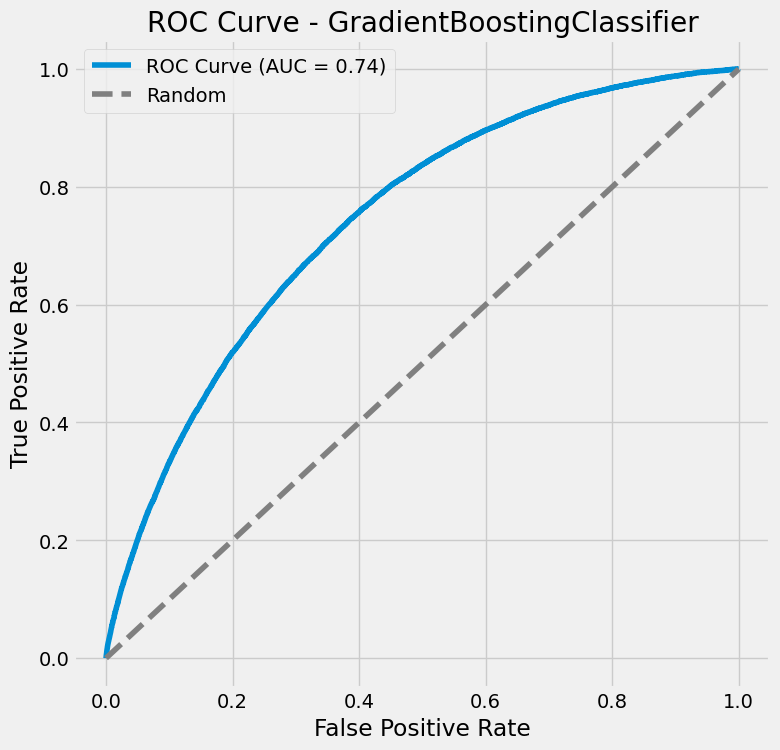

In [14]:
# GradientBoostingClassifier
gb_model = GradientBoostingClassifier(
)
gb_model.fit(X_rus, y_rus)

y_proba_gb = gb_model.predict_proba(X_test)[:, 1]

roc_auc_gb = roc_auc_score(y_test, y_proba_gb)

# Выводим матрицу ошибок и другие метрики
print("GradientBoostingClassifier:")
print("\nROC AUC:", roc_auc_gb)

# Рисуем ROC-кривую
fpr_gb, tpr_gb, _ = roc_curve(y_test, y_proba_gb)
plt.figure(figsize=(8, 8))
plt.plot(fpr_gb, tpr_gb, label=f'ROC Curve (AUC = {roc_auc_gb:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.title('ROC Curve - GradientBoostingClassifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.092369
0:	learn: 0.6837791	total: 135ms	remaining: 2m 14s
1:	learn: 0.6762534	total: 208ms	remaining: 1m 43s
2:	learn: 0.6691752	total: 267ms	remaining: 1m 28s
3:	learn: 0.6633065	total: 324ms	remaining: 1m 20s
4:	learn: 0.6581184	total: 378ms	remaining: 1m 15s
5:	learn: 0.6532986	total: 430ms	remaining: 1m 11s
6:	learn: 0.6495475	total: 488ms	remaining: 1m 9s
7:	learn: 0.6455682	total: 544ms	remaining: 1m 7s
8:	learn: 0.6422711	total: 597ms	remaining: 1m 5s
9:	learn: 0.6391329	total: 654ms	remaining: 1m 4s
10:	learn: 0.6363581	total: 717ms	remaining: 1m 4s
11:	learn: 0.6339437	total: 774ms	remaining: 1m 3s
12:	learn: 0.6314789	total: 829ms	remaining: 1m 2s
13:	learn: 0.6292832	total: 879ms	remaining: 1m 1s
14:	learn: 0.6274620	total: 941ms	remaining: 1m 1s
15:	learn: 0.6257933	total: 985ms	remaining: 1m
16:	learn: 0.6240270	total: 1.04s	remaining: 1m
17:	learn: 0.6225281	total: 1.08s	remaining: 59.2s
18:	learn: 0.6211051	total: 1.14s	remaining: 58.7s
19:	learn: 

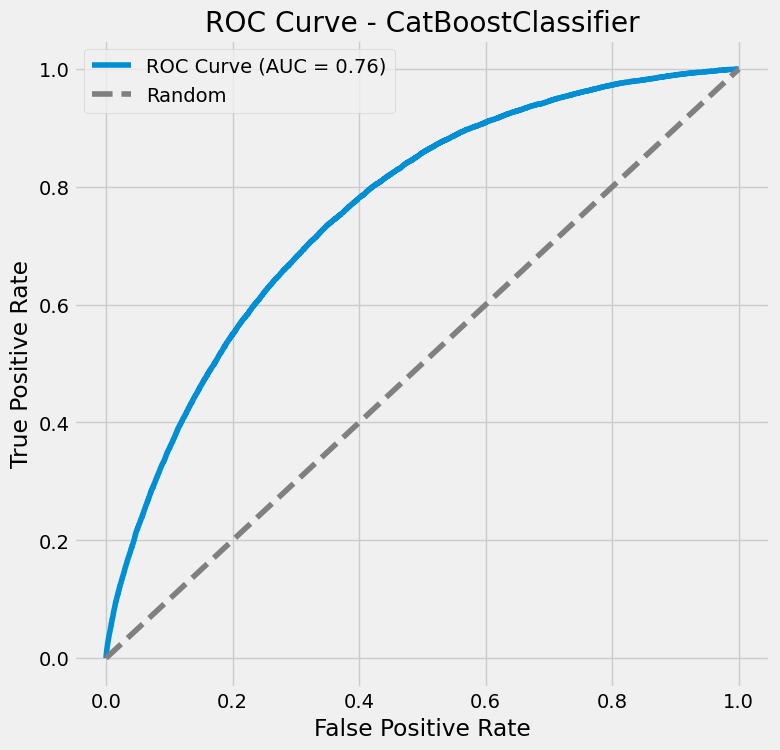

In [15]:
# CatBoostClassifier
cat_model = CatBoostClassifier()
cat_model.fit(X_rus, y_rus, plot=True)
y_proba_cat = cat_model.predict_proba(X_test)[:, 1]
roc_auc_cat = roc_auc_score(y_test, y_proba_cat)
print("\nROC AUC:", roc_auc_cat)

# Рисуем ROC-кривую
fpr_cat, tpr_cat, _ = roc_curve(y_test, y_proba_cat)
plt.figure(figsize=(8, 8))
plt.plot(fpr_cat, tpr_cat, label=f'ROC Curve (AUC = {roc_auc_cat:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.title('ROC Curve - CatBoostClassifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

                       Feature  Importance
199                 pre_util_3    4.165119
202                 pre_util_6    3.143749
385      total_delinquencies_5    3.024991
381      total_delinquencies_1    2.976460
83          pre_till_pclose_10    2.439872
..                         ...         ...
232          pre_over2limit_16    0.000000
181            pre_loans3060_1    0.000000
180            pre_loans530_19    0.000000
138  pre_loans_total_overdue_0    0.000000
223           pre_over2limit_7    0.000000

[397 rows x 2 columns]


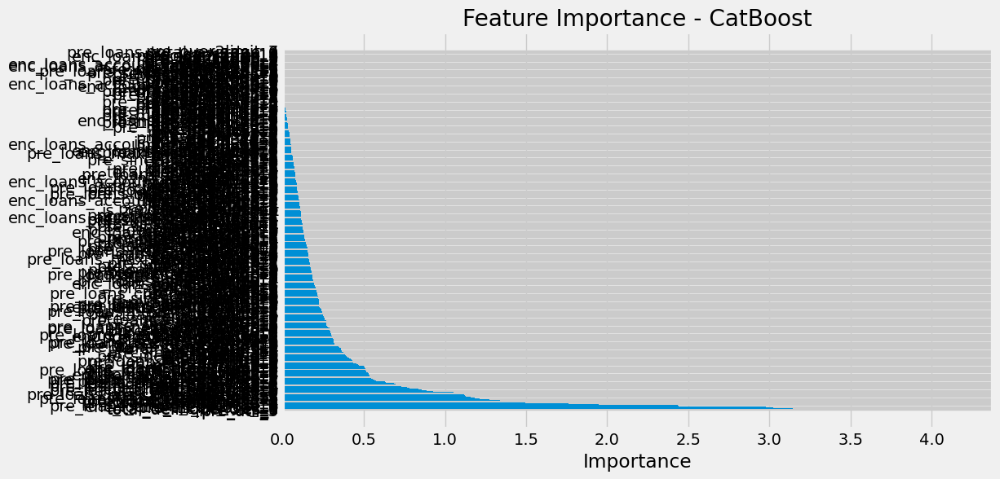

In [16]:
feature_importance = cat_model.feature_importances_
# Создаем DataFrame с именами признаков и их важностями
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})

# Сортируем признаки по важности
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Выводим важности признаков
print(feature_importance_df)

# Рисуем график важности признаков
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.title('Feature Importance - CatBoost')
plt.show()

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 85088, number of negative: 85088
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.089263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5910
[LightGBM] [Info] Number of data points in the train set: 170176, number of used features: 382
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_

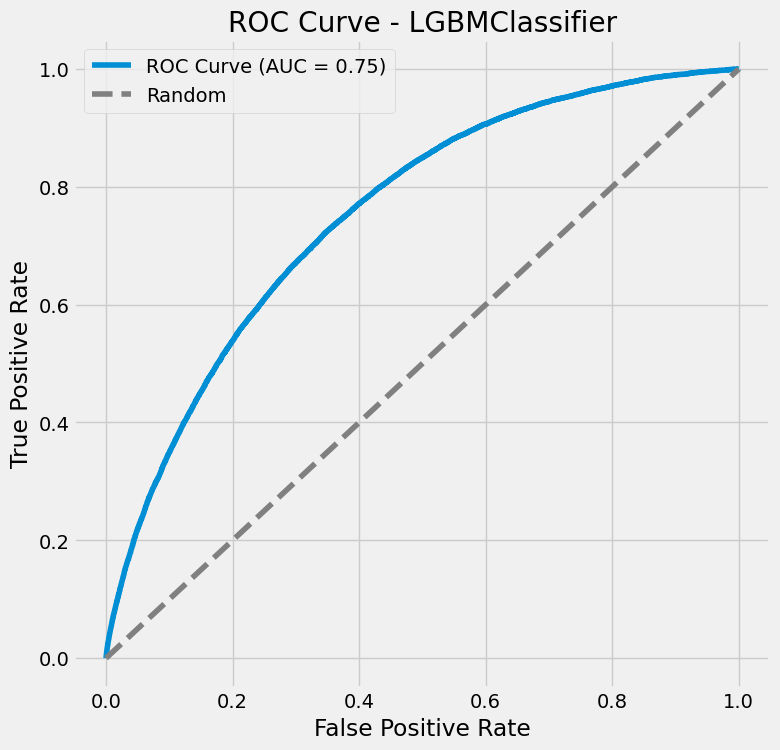

In [17]:
# LGBMClassifier
lgb_model = lgb.LGBMClassifier(max_depth=10)
lgb_model.fit(X_rus, y_rus)

y_pred_lgb = lgb_model.predict(X_test)
y_proba_lgb = lgb_model.predict_proba(X_test)[:, 1]

roc_auc_lgb = roc_auc_score(y_test, y_proba_lgb)

# Выводим матрицу ошибок и другие метрики
print("\nLGBMClassifier:")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_lgb))
print("\nROC AUC:", roc_auc_lgb)

# Рисуем ROC-кривую
fpr_lgb, tpr_lgb, _ = roc_curve(y_test, y_proba_lgb)
plt.figure(figsize=(8, 8))
plt.plot(fpr_lgb, tpr_lgb, label=f'ROC Curve (AUC = {roc_auc_lgb:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.title('ROC Curve - LGBMClassifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Как видно действительно метрика увеличилась при новом кодировании. Лучшая модель catboost. Посмотрим как она себя проявляет на данных без балансировки.

Learning rate set to 0.285946
0:	learn: 0.3603085	total: 565ms	remaining: 9m 24s
1:	learn: 0.2365466	total: 1.16s	remaining: 9m 37s
2:	learn: 0.1852008	total: 1.99s	remaining: 11m
3:	learn: 0.1634250	total: 2.66s	remaining: 11m 2s
4:	learn: 0.1533146	total: 3.31s	remaining: 10m 58s
5:	learn: 0.1488366	total: 3.75s	remaining: 10m 21s
6:	learn: 0.1462726	total: 4.29s	remaining: 10m 8s
7:	learn: 0.1445065	total: 5s	remaining: 10m 20s
8:	learn: 0.1434528	total: 5.63s	remaining: 10m 19s
9:	learn: 0.1428102	total: 6.25s	remaining: 10m 18s
10:	learn: 0.1423582	total: 6.85s	remaining: 10m 16s
11:	learn: 0.1420013	total: 7.52s	remaining: 10m 19s
12:	learn: 0.1416908	total: 8.22s	remaining: 10m 24s
13:	learn: 0.1415045	total: 8.74s	remaining: 10m 15s
14:	learn: 0.1412560	total: 9.52s	remaining: 10m 25s
15:	learn: 0.1409761	total: 10.2s	remaining: 10m 28s
16:	learn: 0.1407886	total: 10.8s	remaining: 10m 25s
17:	learn: 0.1406853	total: 11.4s	remaining: 10m 19s
18:	learn: 0.1405695	total: 11.9s	rem

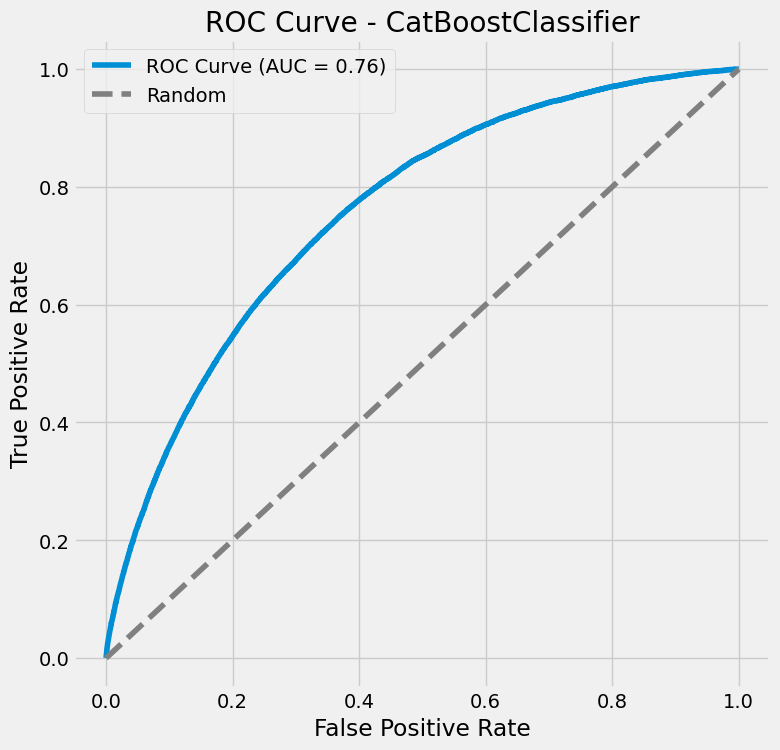

In [18]:
# CatBoostClassifier
cat_model = CatBoostClassifier()
cat_model.fit(X_train, y_train)
y_proba_cat = cat_model.predict_proba(X_test)[:, 1]
roc_auc_cat = roc_auc_score(y_test, y_proba_cat)
print("\nROC AUC:", roc_auc_cat)

# Рисуем ROC-кривую
fpr_cat, tpr_cat, _ = roc_curve(y_test, y_proba_cat)
plt.figure(figsize=(8, 8))
plt.plot(fpr_cat, tpr_cat, label=f'ROC Curve (AUC = {roc_auc_cat:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.title('ROC Curve - CatBoostClassifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Метрика немного упала. Но посмотрим на метрику с кроссвалидацией на всех данных без балансировки. 

In [19]:
cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

cross_val_scores = cross_val_score(cat_model, X, y, cv=cv, scoring="roc_auc")

print("Cross-validation AUC scores:", cross_val_scores)

print(f"Mean AUC: {cross_val_scores.mean():.4f}")
print(f"Standard Deviation: {cross_val_scores.std():.4f}")

Learning rate set to 0.278174
0:	learn: 0.3679765	total: 428ms	remaining: 7m 7s
1:	learn: 0.2409608	total: 996ms	remaining: 8m 17s
2:	learn: 0.1886836	total: 1.51s	remaining: 8m 21s
3:	learn: 0.1654688	total: 2.15s	remaining: 8m 56s
4:	learn: 0.1552890	total: 2.77s	remaining: 9m 12s
5:	learn: 0.1498049	total: 3.41s	remaining: 9m 25s
6:	learn: 0.1467093	total: 4.29s	remaining: 10m 8s
7:	learn: 0.1450359	total: 5.17s	remaining: 10m 41s
8:	learn: 0.1439721	total: 5.96s	remaining: 10m 55s
9:	learn: 0.1431766	total: 6.91s	remaining: 11m 23s
10:	learn: 0.1425432	total: 7.74s	remaining: 11m 35s
11:	learn: 0.1421327	total: 8.58s	remaining: 11m 46s
12:	learn: 0.1418834	total: 9.27s	remaining: 11m 43s
13:	learn: 0.1416374	total: 9.89s	remaining: 11m 36s
14:	learn: 0.1414202	total: 10.9s	remaining: 11m 54s
15:	learn: 0.1412096	total: 12.2s	remaining: 12m 28s
16:	learn: 0.1409104	total: 13.1s	remaining: 12m 38s
17:	learn: 0.1407817	total: 14s	remaining: 12m 43s
18:	learn: 0.1406710	total: 14.6s	re

Метрика на всех данных получилась даже немного больше. Теперь подберем гиперпараметры.

In [20]:
cat_model = CatBoostClassifier()
params = {
    'learning_rate': [0.04, 0.1, 0.02],
    'l2_leaf_reg': range(4, 9)
}

# Создание объекта GridSearchCV
grid_search = GridSearchCV(cat_model, params)

# Поиск лучших параметров
grid_search.fit(X_rus, y_rus)

# Вывод лучших параметров
print("Лучшие параметры:", grid_search.best_params_)

0:	learn: 0.6888655	total: 43.2ms	remaining: 43.1s
1:	learn: 0.6849884	total: 83.9ms	remaining: 41.9s
2:	learn: 0.6813095	total: 125ms	remaining: 41.4s
3:	learn: 0.6778877	total: 166ms	remaining: 41.4s
4:	learn: 0.6748895	total: 211ms	remaining: 42.1s
5:	learn: 0.6717782	total: 252ms	remaining: 41.8s
6:	learn: 0.6689312	total: 303ms	remaining: 43s
7:	learn: 0.6663790	total: 347ms	remaining: 43.1s
8:	learn: 0.6638117	total: 391ms	remaining: 43.1s
9:	learn: 0.6614542	total: 434ms	remaining: 42.9s
10:	learn: 0.6592721	total: 480ms	remaining: 43.2s
11:	learn: 0.6571930	total: 526ms	remaining: 43.3s
12:	learn: 0.6551600	total: 569ms	remaining: 43.2s
13:	learn: 0.6533496	total: 611ms	remaining: 43.1s
14:	learn: 0.6516399	total: 653ms	remaining: 42.9s
15:	learn: 0.6499725	total: 696ms	remaining: 42.8s
16:	learn: 0.6482972	total: 741ms	remaining: 42.8s
17:	learn: 0.6466364	total: 787ms	remaining: 42.9s
18:	learn: 0.6451522	total: 831ms	remaining: 42.9s
19:	learn: 0.6436119	total: 879ms	remaini

In [22]:
cat_model = CatBoostClassifier(l2_leaf_reg=4, learning_rate=0.1)
params = {
    'depth': range(4, 10)
}

# Создание объекта GridSearchCV
grid_search = GridSearchCV(cat_model, params)

# Поиск лучших параметров
grid_search.fit(X_rus, y_rus)

# Вывод лучших параметров
print("Лучшие параметры:", grid_search.best_params_)

0:	learn: 0.6863330	total: 39.6ms	remaining: 39.5s
1:	learn: 0.6798319	total: 74.3ms	remaining: 37.1s
2:	learn: 0.6737109	total: 222ms	remaining: 1m 13s
3:	learn: 0.6693944	total: 315ms	remaining: 1m 18s
4:	learn: 0.6650803	total: 359ms	remaining: 1m 11s
5:	learn: 0.6612794	total: 400ms	remaining: 1m 6s
6:	learn: 0.6576050	total: 445ms	remaining: 1m 3s
7:	learn: 0.6538829	total: 488ms	remaining: 1m
8:	learn: 0.6507821	total: 525ms	remaining: 57.8s
9:	learn: 0.6476998	total: 564ms	remaining: 55.8s
10:	learn: 0.6449938	total: 604ms	remaining: 54.3s
11:	learn: 0.6428174	total: 640ms	remaining: 52.7s
12:	learn: 0.6404971	total: 676ms	remaining: 51.3s
13:	learn: 0.6385331	total: 715ms	remaining: 50.4s
14:	learn: 0.6368420	total: 754ms	remaining: 49.5s
15:	learn: 0.6352110	total: 791ms	remaining: 48.6s
16:	learn: 0.6334718	total: 830ms	remaining: 48s
17:	learn: 0.6317312	total: 867ms	remaining: 47.3s
18:	learn: 0.6301840	total: 904ms	remaining: 46.7s
19:	learn: 0.6288644	total: 938ms	remaini

In [25]:
cat_model = CatBoostClassifier(l2_leaf_reg=4, learning_rate=0.1, depth=6)
params = {
    'n_estimators': [1500, 2000, 2500, 3000]
}

# Создание объекта GridSearchCV
grid_search = GridSearchCV(cat_model, params)

# Поиск лучших параметров
grid_search.fit(X_rus, y_rus)

# Вывод лучших параметров
print("Лучшие параметры:", grid_search.best_params_)

0:	learn: 0.6827963	total: 50.4ms	remaining: 1m 15s
1:	learn: 0.6745764	total: 96.2ms	remaining: 1m 12s
2:	learn: 0.6674380	total: 142ms	remaining: 1m 10s
3:	learn: 0.6616454	total: 186ms	remaining: 1m 9s
4:	learn: 0.6561760	total: 229ms	remaining: 1m 8s
5:	learn: 0.6513431	total: 273ms	remaining: 1m 7s
6:	learn: 0.6472305	total: 315ms	remaining: 1m 7s
7:	learn: 0.6432054	total: 363ms	remaining: 1m 7s
8:	learn: 0.6396976	total: 410ms	remaining: 1m 7s
9:	learn: 0.6368211	total: 449ms	remaining: 1m 6s
10:	learn: 0.6341583	total: 492ms	remaining: 1m 6s
11:	learn: 0.6315938	total: 539ms	remaining: 1m 6s
12:	learn: 0.6292891	total: 583ms	remaining: 1m 6s
13:	learn: 0.6270402	total: 628ms	remaining: 1m 6s
14:	learn: 0.6251987	total: 671ms	remaining: 1m 6s
15:	learn: 0.6235405	total: 712ms	remaining: 1m 6s
16:	learn: 0.6220333	total: 760ms	remaining: 1m 6s
17:	learn: 0.6204992	total: 802ms	remaining: 1m 6s
18:	learn: 0.6189855	total: 849ms	remaining: 1m 6s
19:	learn: 0.6175223	total: 901ms	re

In [26]:
cat_model = CatBoostClassifier(l2_leaf_reg=4, learning_rate=0.1, depth=6, n_estimators=2000, bootstrap_type='Bernoulli')

cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

cross_val_scores = cross_val_score(cat_model, X, y, cv=cv, scoring="roc_auc")

print("Cross-validation AUC scores:", cross_val_scores)

print(f"Mean AUC: {cross_val_scores.mean():.4f}")
print(f"Standard Deviation: {cross_val_scores.std():.4f}")

0:	learn: 0.5523267	total: 1.21s	remaining: 40m 15s
1:	learn: 0.4486117	total: 1.88s	remaining: 31m 20s
2:	learn: 0.3728351	total: 2.25s	remaining: 24m 59s
3:	learn: 0.3166829	total: 2.7s	remaining: 22m 26s
4:	learn: 0.2751182	total: 3.27s	remaining: 21m 43s
5:	learn: 0.2448951	total: 3.82s	remaining: 21m 10s
6:	learn: 0.2222093	total: 4.34s	remaining: 20m 36s
7:	learn: 0.2054061	total: 4.92s	remaining: 20m 25s
8:	learn: 0.1915275	total: 5.73s	remaining: 21m 7s
9:	learn: 0.1816054	total: 6.31s	remaining: 20m 54s
10:	learn: 0.1735914	total: 6.84s	remaining: 20m 37s
11:	learn: 0.1675787	total: 7.38s	remaining: 20m 23s
12:	learn: 0.1632279	total: 7.84s	remaining: 19m 58s
13:	learn: 0.1594800	total: 8.31s	remaining: 19m 39s
14:	learn: 0.1564589	total: 8.88s	remaining: 19m 35s
15:	learn: 0.1538722	total: 9.69s	remaining: 20m 1s
16:	learn: 0.1518970	total: 10.4s	remaining: 20m 10s
17:	learn: 0.1503571	total: 10.9s	remaining: 19m 59s
18:	learn: 0.1491313	total: 11.4s	remaining: 19m 47s
19:	le

Подводя итог, можем увидеть метрику 76.17 на данных без балансировки при указанных гиперпараметрах. Отклонение незначительное. Лучша модель Catboost, которая пойдет в итоговый pipeline. 